In [1]:
import anndata as ad
import scanpy as sc
import gc
import sys
import cellanova as cnova
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sea

from metrics import calculate_metrics

R_HOME is already set to: /vast/palmer/apps/avx2/software/R/4.3.2-foss-2022b-patched/lib64/R


Unable to determine R library path: Command '('/vast/palmer/apps/avx2/software/R/4.3.2-foss-2022b-patched/lib64/R/bin/Rscript', '-e', 'cat(Sys.getenv("LD_LIBRARY_PATH"))')' returned non-zero exit status 127.


/gpfs/gibbs/project/wang_zuoheng/xx244/Ndreamer/case_control_benchmark/metrics.py:29: DeprecationWarning: The global conversion available with activate() is deprecated and will be removed in the next major release. Use a local converter.
  anndata2ri.activate()
/home/xx244/.conda/envs/benchmark/lib/python3.11/site-packages/rpy2/robjects/pandas2ri.py:368: DeprecationWarning: The global conversion available with activate() is deprecated and will be removed in the next major release. Use a local converter.
  warnings.warn('The global conversion available with activate() '
/home/xx244/.conda/envs/benchmark/lib/python3.11/site-packages/rpy2/robjects/numpy2ri.py:241: DeprecationWarning: The global conversion available with activate() is deprecated and will be removed in the next major release. Use a local converter.
  warnings.warn('The global conversion available with activate() '


In [2]:
def calculate_mean_proportion_matrix(df):
    """
    Calculates the mean proportion for each combination of condition and neighbor
    and summarizes the result in a square matrix dataframe.

    Parameters:
    df (pd.DataFrame): Input dataframe with columns ['condition', 'neighbor', 'proportion'].

    Returns:
    pd.DataFrame: A square matrix dataframe where rows represent 'condition' and columns represent 'neighbor'.
    """
    # Use a pivot table to calculate the mean proportions
    mean_matrix = df.pivot_table(
        index='condition',
        columns='neighbor',
        values='proportion',
        aggfunc='mean',
        fill_value=0  # Replace NaN with 0 if there are missing combinations
    )

    return mean_matrix

def calculate_rowwise_correlation(adata1, adata2, batch_key="batch_all_with_condition"):
    # Ensure the obs index and batch_key match
    #assert np.sum(adata1.obs["batch_all_with_condition"]!=adata2.obs["batch_all_with_condition"])==0, "obs indices do not match between the two AnnData objects"
    assert batch_key in adata1.obs.columns, f"{batch_key} not found in adata1.obs"
    assert batch_key in adata2.obs.columns, f"{batch_key} not found in adata2.obs"

    results = []

    # Iterate through unique batches
    unique_batches = adata1.obs[batch_key].unique()
    for batch in unique_batches:
        # Subset the data for the current batch
        batch_mask = adata1.obs[batch_key] == batch
        data1 = adata1[batch_mask].X
        data2 = adata2[batch_mask].X
        
        barcodes=adata1[batch_mask].obs_names.tolist()

        # Ensure the data is in dense format if sparse
        if not isinstance(data1, np.ndarray):
            data1 = data1.toarray()
        if not isinstance(data2, np.ndarray):
            data2 = data2.toarray()

        # Compute correlation for each row
        for i in range(data1.shape[0]):
            row_corr = np.corrcoef(data1[i, :], data2[i, :])[0, 1]
            mse=np.mean(np.square(data1[i, :]-data2[i, :]))
            results.append({"correlation": row_corr, batch_key: batch, "barcode":barcodes[i], "mse":mse})

    # Convert results to DataFrame
    result_df = pd.DataFrame(results)
    return result_df


def extract_de_results(adata, batch_key, cell_type_key, key_added="DE_wilcoxon", min_cells=30):
    results = []

    # Iterate through unique batches
    unique_batches = adata.obs[batch_key].unique()
    for batch in unique_batches:
        # Subset the AnnData for the current batch
        adata_batch = adata[adata.obs[batch_key] == batch]
        
        # Filter out cell types with fewer than `min_cells` cells
        cell_counts = adata_batch.obs[cell_type_key].value_counts()
        valid_cell_types = cell_counts[cell_counts >= min_cells].index
        
        # Subset the AnnData object to only include valid cell types
        adata_batch = adata_batch[adata_batch.obs[cell_type_key].isin(valid_cell_types)]
        
        # Skip the batch if there are no valid cell types
        if adata_batch.shape[0] == 0 or len(valid_cell_types) == 0:
            continue
        
        # Perform DE analysis
        sc.tl.rank_genes_groups(adata_batch, groupby=cell_type_key, method='wilcoxon', key_added=key_added, use_raw=False)
        
        # Extract DE results for each valid cell type
        for cell_type in valid_cell_types:
            # Extract adjusted p-values and gene names
            gene_names = adata_batch.uns[key_added]['names'][cell_type]
            pvals_adj = adata_batch.uns[key_added]['pvals_adj'][cell_type]
            
            # Create a dictionary for the current cell type and batch
            row_data = {
                "cell_type_key": cell_type,
                "batch_all_with_condition": batch,
            }
            # Add adjusted p-values for each gene as separate columns
            row_data.update({gene: pval for gene, pval in zip(gene_names, pvals_adj)})
            results.append(row_data)
    
    # Convert results to a DataFrame
    result_df = pd.DataFrame(results)
    return result_df
    
def evaluate_scd(adata, cell_type_key, batch_key, condition_key, dataset_name):
    adata.raw=None
    print("adata preprocessing...")

    import warnings
    warnings.filterwarnings("ignore")
    warnings.filterwarnings("ignore", category=FutureWarning)

    if isinstance(batch_key, str):
       batch_key = [batch_key]

    batch_all = []
    for i in range(adata.shape[0]):
        tmp = "__".join([adata.obs[batch_keyj][i] for batch_keyj in batch_key])
        batch_all.append(tmp)
    batch_all = np.array(batch_all)
    adata.obs["batch_all"]=batch_all
    adata.obs["batch_all"] = adata.obs["batch_all"].astype("category")
    print("batch_all",np.unique(batch_all))

    batch_all_with_condition = []
    for i in range(adata.shape[0]):
        tmp = "__".join([adata.obs[batch_keyj][i] for batch_keyj in batch_key])
        tmp = tmp + "__" + adata.obs[condition_key][i]
        batch_all_with_condition.append(tmp)
    batch_all_with_condition = np.array(batch_all_with_condition)
    adata.obs["batch_all_with_condition"] = batch_all_with_condition
    adata.obs["batch_all_with_condition"] = adata.obs["batch_all_with_condition"].astype("category")
    print("batch_all_with_condition", np.unique(batch_all_with_condition))

    batch_key.append("batch_all_with_condition")
    batch_key.append("batch_all")

    main_effect_adata = ad.AnnData(adata.obsm['main_effect'], dtype=np.float32)
    #main_effect_adata.var_names = adata.var_names
    main_effect_adata.obs = adata.obs.copy()

    integrated = ad.AnnData(adata.layers['denoised'], dtype=np.float32)
    integrated.obs = adata.obs.copy()
    integrated.var_names = adata.var_names
    print("Finish preprocessing")
    
    print("Calculating global distortion...")
    df_global_correlation=calculate_rowwise_correlation(adata, integrated)
    df_global_correlation.to_csv("./scd/"+dataset_name+"_global_correlation.csv")
    print("Finish")

    print("Evaluate gene-level signal distortion")
    if True:#dataset_name!="mouse":
        real_data_DE = extract_de_results(adata=adata, batch_key="batch_all_with_condition", cell_type_key=cell_type_key,key_added="DE_wilcoxon")
        denoised_DE = extract_de_results(adata=integrated, batch_key="batch_all_with_condition", cell_type_key=cell_type_key,key_added="DE_wilcoxon")
        real_data_DE.to_csv("./scd/"+dataset_name+"_real_DE.csv")
        denoised_DE.to_csv("./scd/"+dataset_name+"_denoised_DE.csv")
    print("Finish")
    
    print("Plot of main effect:")
    if main_effect_adata.shape[1] > 60:
        sc.pp.pca(main_effect_adata)
    else:
        main_effect_adata.obsm['X_pca']=main_effect_adata.X.copy()
    sc.pp.neighbors(main_effect_adata, n_neighbors=15)
    sc.tl.umap(main_effect_adata)
    sc.pl.umap(main_effect_adata, color=[cell_type_key, condition_key] + batch_key, ncols=1)
    
    print("Plot of denoised expression")
    sc.pp.pca(integrated)
    sc.pp.neighbors(integrated, n_neighbors=15)
    sc.tl.umap(integrated)
    sc.pl.umap(integrated, color=[cell_type_key, condition_key] + batch_key, ncols=1)

    print("Finish adata preprocessing","="*20)

    print("Batch-related mixing performance evaluation for main effect:")
    for batch_keyi in batch_key:
        print(batch_keyi)
        import rpy2.robjects as robjects
        import anndata2ri
        anndata2ri.activate()
        # Add your library path
        library_path = "/gpfs/gibbs/project/wang_zuoheng/xx244/R/4.3/"  # Replace with the actual path
        # Update R's library paths
        robjects.r(f'.libPaths(c("{library_path}", .libPaths()))')
        # Verify the updated library paths
        print(robjects.r('.libPaths()'))
        calculate_metrics(main_effect_adata, batch_key=batch_keyi,
                          celltype_key=cell_type_key, all=True, n_neighbors=15)
        print("=" * 20)

    print("Within each unique condition, evaluate the batch effect of denoised data")
    unique_conditions=np.unique(np.array(integrated.obs[condition_key]))
    for conditioni in unique_conditions:
        print("Within each unique condition, evaluate the batch effect of denoised data")
        print("Now evaluating",conditioni)
        integratedi=integrated[integrated.obs[condition_key]==conditioni].copy()
        import rpy2.robjects as robjects
        import anndata2ri
        anndata2ri.activate()
        # Add your library path
        library_path = "/gpfs/gibbs/project/wang_zuoheng/xx244/R/4.3/"  # Replace with the actual path
        # Update R's library paths
        robjects.r(f'.libPaths(c("{library_path}", .libPaths()))')
        # Verify the updated library paths
        print(robjects.r('.libPaths()'))
        calculate_metrics(integratedi, batch_key="batch_all",
                          celltype_key=cell_type_key, all=True, n_neighbors=15)
        print("*"*20)
    
    print("Batch-related mixing performance evaluation for main effect:")
    for batch_keyi in batch_key:
        print("Batch-related mixing performance evaluation for main effect:")
        print(batch_keyi)
        import rpy2.robjects as robjects
        import anndata2ri
        anndata2ri.activate()
        # Add your library path
        library_path = "/gpfs/gibbs/project/wang_zuoheng/xx244/R/4.3/"  # Replace with the actual path
        # Update R's library paths
        robjects.r(f'.libPaths(c("{library_path}", .libPaths()))')
        # Verify the updated library paths
        print(robjects.r('.libPaths()'))
        calculate_metrics(main_effect_adata, batch_key=batch_keyi,
                          celltype_key=cell_type_key, all=True, n_neighbors=15)
        print("=" * 20)
    
    res = cnova.utils.calc_oobNN(integrated, batch_key="batch_all_with_condition", condition_key=condition_key)
    df = res.obsm['knn_prop']
    df['condition'] = res.obs[condition_key]
    df.index.name = "index"

    df = df.reset_index()
    df = pd.melt(df, id_vars=['index', 'condition'], var_name='neighbor', value_name='proportion')
    df = df.rename(columns={'index': 'obs_name'})
    df.to_csv("./scd/" + dataset_name + "_oobNN.csv")

    g = sea.FacetGrid(df, col='neighbor', hue='condition')
    g.map(sea.kdeplot, 'proportion', bw_adjust=2, alpha=1)
    g.set(xlabel='NN proportion', ylabel='Density')
    g.add_legend()
    plt.suptitle('scd integration')
    sea.set_style('white')
    plt.show()

    df_summarize=calculate_mean_proportion_matrix(df)
    print(df_summarize)
    df_summarize.to_csv("./scd/"+dataset_name+"_summary.csv",index=False)

# Type 1 diabetes

https://www.ncbi.nlm.nih.gov/geo/query/acc.cgi?acc=GSE148073

adata preprocessing...


batch_all ['HPAP019' 'HPAP020' 'HPAP021' 'HPAP022' 'HPAP023' 'HPAP024' 'HPAP026'
 'HPAP028' 'HPAP029' 'HPAP032' 'HPAP034' 'HPAP035' 'HPAP036' 'HPAP037'
 'HPAP038' 'HPAP039' 'HPAP040' 'HPAP042' 'HPAP043' 'HPAP044' 'HPAP045'
 'HPAP047' 'HPAP049' 'HPAP050']


batch_all_with_condition ['HPAP019__AAB' 'HPAP020__T1D' 'HPAP021__T1D' 'HPAP022__Control'
 'HPAP023__T1D' 'HPAP024__AAB' 'HPAP026__Control' 'HPAP028__T1D'
 'HPAP029__AAB' 'HPAP032__T1D' 'HPAP034__Control' 'HPAP035__Control'
 'HPAP036__Control' 'HPAP037__Control' 'HPAP038__AAB' 'HPAP039__Control'
 'HPAP040__Control' 'HPAP042__Control' 'HPAP043__AAB' 'HPAP044__Control'
 'HPAP045__AAB' 'HPAP047__Control' 'HPAP049__AAB' 'HPAP050__AAB']
Finish preprocessing
Calculating global distortion...


Finish
Evaluate gene-level signal distortion


Finish
Plot of main effect:


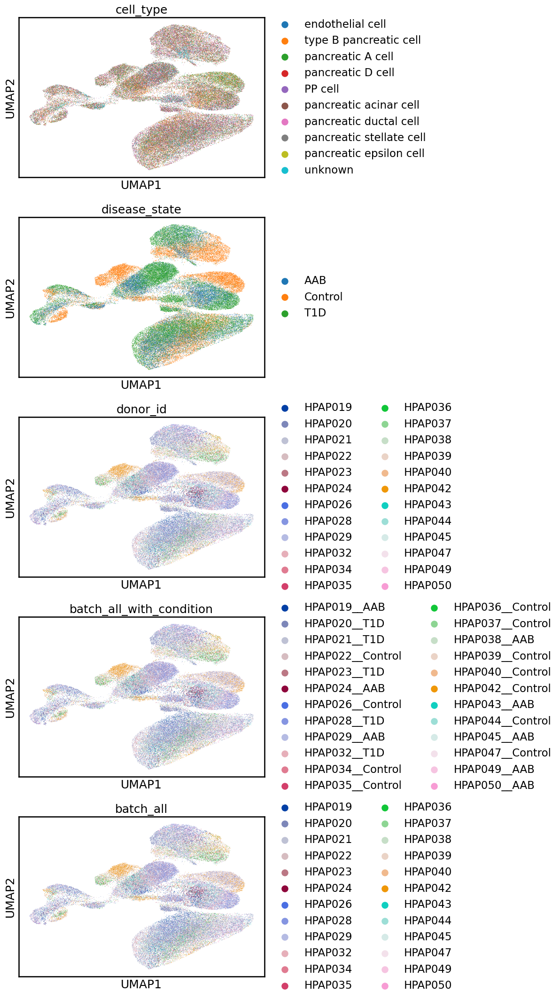

Plot of denoised expression


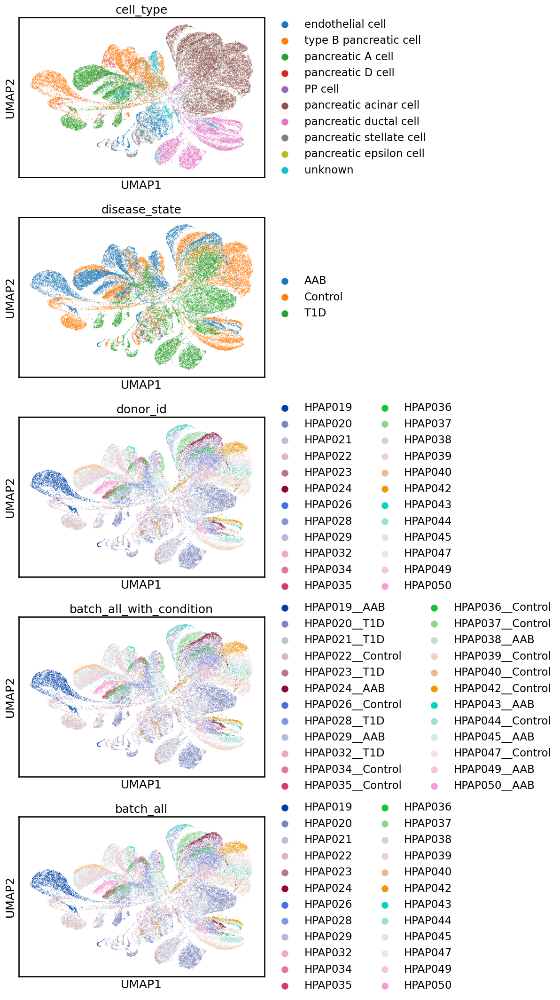

Finish adata preprocessing ====================
Batch-related mixing performance evaluation for main effect:
donor_id
['/gpfs/gibbs/project/wang_zuoheng/xx244/R/4.3'
 '/vast/palmer/apps/avx2/software/R/4.3.2-foss-2022b-patched/lib64/R/library']
LISI---


cLISI, bLISI, LISI_F1 0.7078177535198041 0.09772498686080318 0.17173882202670848


ASW---


asw_label 0.4636407569050789


asw_batch 0.7385489675668715


kBET---


0 labels consist of a single batch or is too small. Skip.


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 4
Adding diffusion to step 5


Adding diffusion to step 6
Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 9


Adding diffusion to step 10


Adding diffusion to step 11


Adding diffusion to step 12


kbet_score 0.010917249389973405
graph_conn 0.37844189343061985


NMI, ARI ---
NMI 0.02100977314766627
ARI 0.005248388315427522
positive and true positive rate---


       ASW_label       ARI      NMI   1-cLISI     bLISI  ASW_batch  \
X_pca   0.463641  0.005248  0.02101  0.707818  0.097725   0.738549   

       kBET Accept Rate  graph connectivity  PCR_batch  pos rate  \
X_pca          0.010917            0.378442        0.0  0.046651   

       true pos rate   F1 LISI  
X_pca       0.000287  0.171739  
batch_all_with_condition
['/gpfs/gibbs/project/wang_zuoheng/xx244/R/4.3'
 '/vast/palmer/apps/avx2/software/R/4.3.2-foss-2022b-patched/lib64/R/library']
LISI---


cLISI, bLISI, LISI_F1 0.7078177535198041 0.09772498686080318 0.17173882202670848


ASW---


asw_label 0.4636407569050789


asw_batch 0.7385489675668715


kBET---


0 labels consist of a single batch or is too small. Skip.


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 4
Adding diffusion to step 5


Adding diffusion to step 6
Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 9


Adding diffusion to step 10


Adding diffusion to step 11


Adding diffusion to step 12


kbet_score 0.011000377951325468
graph_conn 0.37844189343061985


NMI, ARI ---
NMI 0.02100977314766627
ARI 0.005248388315427522
positive and true positive rate---


       ASW_label       ARI      NMI   1-cLISI     bLISI  ASW_batch  \
X_pca   0.463641  0.005248  0.02101  0.707818  0.097725   0.738549   

       kBET Accept Rate  graph connectivity  PCR_batch  pos rate  \
X_pca             0.011            0.378442        0.0  0.046651   

       true pos rate   F1 LISI  
X_pca       0.000287  0.171739  
batch_all
['/gpfs/gibbs/project/wang_zuoheng/xx244/R/4.3'
 '/vast/palmer/apps/avx2/software/R/4.3.2-foss-2022b-patched/lib64/R/library']
LISI---


cLISI, bLISI, LISI_F1 0.7078177535198041 0.09772498686080318 0.17173882202670848


ASW---


asw_label 0.4636407569050789


asw_batch 0.7385489675668715


kBET---


0 labels consist of a single batch or is too small. Skip.


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 4
Adding diffusion to step 5


Adding diffusion to step 6
Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 9


Adding diffusion to step 10


Adding diffusion to step 11


Adding diffusion to step 12


kbet_score 0.010833163829450543
graph_conn 0.37844189343061985


NMI, ARI ---
NMI 0.02100977314766627
ARI 0.005248388315427522
positive and true positive rate---


       ASW_label       ARI      NMI   1-cLISI     bLISI  ASW_batch  \
X_pca   0.463641  0.005248  0.02101  0.707818  0.097725   0.738549   

       kBET Accept Rate  graph connectivity  PCR_batch  pos rate  \
X_pca          0.010833            0.378442        0.0  0.046651   

       true pos rate   F1 LISI  
X_pca       0.000287  0.171739  
Within each unique condition, evaluate the batch effect of denoised data
Within each unique condition, evaluate the batch effect of denoised data
Now evaluating AAB
['/gpfs/gibbs/project/wang_zuoheng/xx244/R/4.3'
 '/vast/palmer/apps/avx2/software/R/4.3.2-foss-2022b-patched/lib64/R/library']


LISI---


cLISI, bLISI, LISI_F1 0.9666235522237792 0.056917434318705946 0.10750469843022256


ASW---


asw_label 0.6008683443069458


asw_batch 0.7787569931970002


kBET---


0 labels consist of a single batch or is too small. Skip.
Adding diffusion to step 4
Adding diffusion to step 5


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 4
Adding diffusion to step 5
Adding diffusion to step 6
Adding diffusion to step 7


Adding diffusion to step 4


Adding diffusion to step 4
Adding diffusion to step 5
Adding diffusion to step 6


Adding diffusion to step 7
Adding diffusion to step 8


Adding diffusion to step 9
Adding diffusion to step 10


Adding diffusion to step 11
Adding diffusion to step 12


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 4
Adding diffusion to step 5


Adding diffusion to step 6


kbet_score 0.08994143409838506
graph_conn 0.8241622396812364


NMI, ARI ---
NMI 0.6295835368777861
ARI 0.5543826777251374
positive and true positive rate---


       ASW_label       ARI       NMI   1-cLISI     bLISI  ASW_batch  \
X_pca   0.600868  0.554383  0.629584  0.966624  0.056917   0.778757   

       kBET Accept Rate  graph connectivity  PCR_batch  pos rate  \
X_pca          0.089941            0.824162        0.0  0.859523   

       true pos rate   F1 LISI  
X_pca       0.007651  0.107505  
********************
Within each unique condition, evaluate the batch effect of denoised data
Now evaluating Control
['/gpfs/gibbs/project/wang_zuoheng/xx244/R/4.3'
 '/vast/palmer/apps/avx2/software/R/4.3.2-foss-2022b-patched/lib64/R/library']


LISI---


cLISI, bLISI, LISI_F1 0.9770988017919963 0.04862571770188839 0.09264111289108025


ASW---


asw_label 0.6835440695285797


asw_batch 0.7967561881893259


kBET---


0 labels consist of a single batch or is too small. Skip.
Adding diffusion to step 4
Adding diffusion to step 5


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 4
Adding diffusion to step 5


Adding diffusion to step 4


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 9


Adding diffusion to step 4


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 4
Adding diffusion to step 5
Adding diffusion to step 6


kbet_score 0.057564052808187105
graph_conn 0.7608539282129947


NMI, ARI ---
NMI 0.6331717235107245
ARI 0.540618959537188
positive and true positive rate---


       ASW_label       ARI       NMI   1-cLISI     bLISI  ASW_batch  \
X_pca   0.683544  0.540619  0.633172  0.977099  0.048626   0.796756   

       kBET Accept Rate  graph connectivity  PCR_batch  pos rate  \
X_pca          0.057564            0.760854        0.0  0.904151   

       true pos rate   F1 LISI  
X_pca       0.000226  0.092641  
********************
Within each unique condition, evaluate the batch effect of denoised data
Now evaluating T1D
['/gpfs/gibbs/project/wang_zuoheng/xx244/R/4.3'
 '/vast/palmer/apps/avx2/software/R/4.3.2-foss-2022b-patched/lib64/R/library']


LISI---


cLISI, bLISI, LISI_F1 0.9746655175586921 0.04756826333760054 0.09070947736565596


ASW---


asw_label 0.6890694797039032


asw_batch 0.7194027724389604


kBET---


0 labels consist of a single batch or is too small. Skip.
Adding diffusion to step 4


Adding diffusion to step 4
Adding diffusion to step 5
Adding diffusion to step 6


Adding diffusion to step 7
Adding diffusion to step 8


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 4


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 4


Adding diffusion to step 4
Adding diffusion to step 5
Adding diffusion to step 6


Adding diffusion to step 4
Adding diffusion to step 5
Adding diffusion to step 6
Adding diffusion to step 7


Adding diffusion to step 8
Adding diffusion to step 9


Adding diffusion to step 10
Adding diffusion to step 11


kbet_score 0.08511115366369637
graph_conn 0.7929580221843894


NMI, ARI ---
NMI 0.5889461014373041
ARI 0.4616549430492527
positive and true positive rate---


       ASW_label       ARI       NMI   1-cLISI     bLISI  ASW_batch  \
X_pca   0.689069  0.461655  0.588946  0.974666  0.047568   0.719403   

       kBET Accept Rate  graph connectivity  PCR_batch  pos rate  \
X_pca          0.085111            0.792958        0.0  0.899018   

       true pos rate   F1 LISI  
X_pca       0.000982  0.090709  
********************
Batch-related mixing performance evaluation for main effect:
Batch-related mixing performance evaluation for main effect:
donor_id
['/gpfs/gibbs/project/wang_zuoheng/xx244/R/4.3'
 '/vast/palmer/apps/avx2/software/R/4.3.2-foss-2022b-patched/lib64/R/library']
LISI---


cLISI, bLISI, LISI_F1 0.7078177535198041 0.09772498686080318 0.17173882202670848


ASW---


asw_label 0.4636407569050789


asw_batch 0.7385489675668715


kBET---


0 labels consist of a single batch or is too small. Skip.


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 4
Adding diffusion to step 5


Adding diffusion to step 6
Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 9


Adding diffusion to step 10


Adding diffusion to step 11


Adding diffusion to step 12


kbet_score 0.011125072089173793
graph_conn 0.37844189343061985


NMI, ARI ---
NMI 0.02100977314766627
ARI 0.005248388315427522
positive and true positive rate---


       ASW_label       ARI      NMI   1-cLISI     bLISI  ASW_batch  \
X_pca   0.463641  0.005248  0.02101  0.707818  0.097725   0.738549   

       kBET Accept Rate  graph connectivity  PCR_batch  pos rate  \
X_pca          0.011125            0.378442        0.0  0.046651   

       true pos rate   F1 LISI  
X_pca       0.000287  0.171739  
Batch-related mixing performance evaluation for main effect:
batch_all_with_condition
['/gpfs/gibbs/project/wang_zuoheng/xx244/R/4.3'
 '/vast/palmer/apps/avx2/software/R/4.3.2-foss-2022b-patched/lib64/R/library']
LISI---


cLISI, bLISI, LISI_F1 0.7078177535198041 0.09772498686080318 0.17173882202670848


ASW---


asw_label 0.4636407569050789


asw_batch 0.7385489675668715


kBET---


0 labels consist of a single batch or is too small. Skip.


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 4
Adding diffusion to step 5


Adding diffusion to step 6
Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 9


Adding diffusion to step 10


Adding diffusion to step 11


Adding diffusion to step 12


kbet_score 0.010886441665649449
graph_conn 0.37844189343061985


NMI, ARI ---
NMI 0.02100977314766627
ARI 0.005248388315427522
positive and true positive rate---


       ASW_label       ARI      NMI   1-cLISI     bLISI  ASW_batch  \
X_pca   0.463641  0.005248  0.02101  0.707818  0.097725   0.738549   

       kBET Accept Rate  graph connectivity  PCR_batch  pos rate  \
X_pca          0.010886            0.378442        0.0  0.046651   

       true pos rate   F1 LISI  
X_pca       0.000287  0.171739  
Batch-related mixing performance evaluation for main effect:
batch_all
['/gpfs/gibbs/project/wang_zuoheng/xx244/R/4.3'
 '/vast/palmer/apps/avx2/software/R/4.3.2-foss-2022b-patched/lib64/R/library']
LISI---


cLISI, bLISI, LISI_F1 0.7078177535198041 0.09772498686080318 0.17173882202670848


ASW---


asw_label 0.4636407569050789


asw_batch 0.7385489675668715


kBET---


0 labels consist of a single batch or is too small. Skip.


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 4
Adding diffusion to step 5


Adding diffusion to step 6
Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 9


Adding diffusion to step 10


Adding diffusion to step 11


Adding diffusion to step 12


kbet_score 0.011132163434475428
graph_conn 0.37844189343061985


NMI, ARI ---
NMI 0.02100977314766627
ARI 0.005248388315427522
positive and true positive rate---


       ASW_label       ARI      NMI   1-cLISI     bLISI  ASW_batch  \
X_pca   0.463641  0.005248  0.02101  0.707818  0.097725   0.738549   

       kBET Accept Rate  graph connectivity  PCR_batch  pos rate  \
X_pca          0.011132            0.378442        0.0  0.046651   

       true pos rate   F1 LISI  
X_pca       0.000287  0.171739  


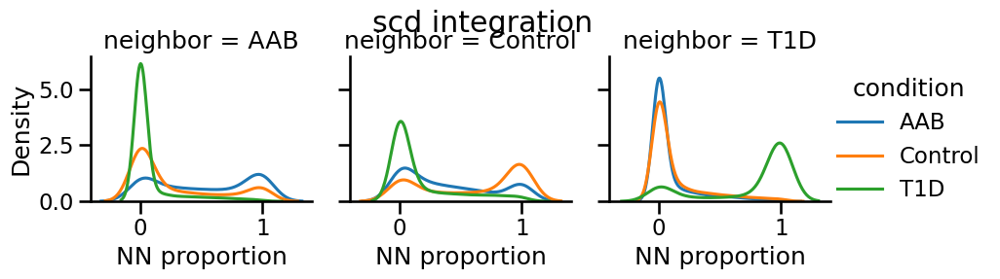

neighbor        AAB   Control       T1D
condition                              
AAB        0.517906  0.389673  0.092420
Control    0.275035  0.596278  0.128686
T1D        0.077637  0.163096  0.759267


In [3]:
adata=sc.read_h5ad("./scd/t1d_latent.h5ad")
evaluate_scd(adata=adata,cell_type_key="cell_type",batch_key="donor_id",
                   condition_key="disease_state",dataset_name="t1d")

# Human kidney multiomics atlas

https://www.ncbi.nlm.nih.gov/geo/query/acc.cgi?acc=GSE211785

adata preprocessing...


batch_all ['HK1584__SC_RNA' 'HK1585__SC_RNA' 'HK1588__SC_RNA' 'HK1593__SC_RNA'
 'HK1594__SC_RNA' 'HK1597__SC_RNA' 'HK1632__SC_RNA' 'HK1634__SC_RNA'
 'HK1635__SC_RNA' 'HK1650__SC_RNA' 'HK1664__SC_RNA' 'HK1770__SC_RNA'
 'HK1997__SC_RNA' 'HK2558__SN_RNA' 'HK2596__SN_RNA' 'HK2662__SC_RNA'
 'HK2663__SN_RNA' 'HK2711__SN_RNA' 'HK2713__SC_RNA' 'HK2739__SN_RNA'
 'HK2770__SC_RNA' 'HK2770__SN_RNA' 'HK2774__SC_RNA' 'HK2774__SN_RNA'
 'HK2833__SC_RNA' 'HK2833__SN_RNA' 'HK2844__SN_RNA' 'HK2862__SN_RNA'
 'HK2867__SC_RNA' 'HK2867__SN_RNA' 'HK2868__SN_RNA' 'HK2891__SC_RNA'
 'HK2891__SN_RNA' 'HK2893__SC_RNA' 'HK2893__SN_RNA' 'HK2895__SC_RNA'
 'HK2895__SN_RNA' 'HK2896__SC_RNA' 'HK2898__SN_RNA' 'HK2899__SC_RNA'
 'HK2899__SN_RNA' 'HK2923__SC_RNA' 'HK2924__SC_RNA' 'HK2976__SN_RNA']


batch_all_with_condition ['HK1584__SC_RNA__Disease' 'HK1585__SC_RNA__Control'
 'HK1588__SC_RNA__Control' 'HK1593__SC_RNA__Disease'
 'HK1594__SC_RNA__Disease' 'HK1597__SC_RNA__Disease'
 'HK1632__SC_RNA__Disease' 'HK1634__SC_RNA__Disease'
 'HK1635__SC_RNA__Disease' 'HK1650__SC_RNA__Disease'
 'HK1664__SC_RNA__Control' 'HK1770__SC_RNA__Disease'
 'HK1997__SC_RNA__Control' 'HK2558__SN_RNA__Disease'
 'HK2596__SN_RNA__Disease' 'HK2662__SC_RNA__Control'
 'HK2663__SN_RNA__Disease' 'HK2711__SN_RNA__Disease'
 'HK2713__SC_RNA__Control' 'HK2739__SN_RNA__Disease'
 'HK2770__SC_RNA__Disease' 'HK2770__SN_RNA__Control'
 'HK2774__SC_RNA__Disease' 'HK2774__SN_RNA__Disease'
 'HK2833__SC_RNA__Control' 'HK2833__SN_RNA__Control'
 'HK2844__SN_RNA__Disease' 'HK2862__SN_RNA__Disease'
 'HK2867__SC_RNA__Control' 'HK2867__SN_RNA__Control'
 'HK2868__SN_RNA__Disease' 'HK2891__SC_RNA__Control'
 'HK2891__SN_RNA__Control' 'HK2893__SC_RNA__Control'
 'HK2893__SN_RNA__Control' 'HK2895__SC_RNA__Control'
 'HK2895__SN_RNA__Con

Finish
Evaluate gene-level signal distortion


Finish
Plot of main effect:


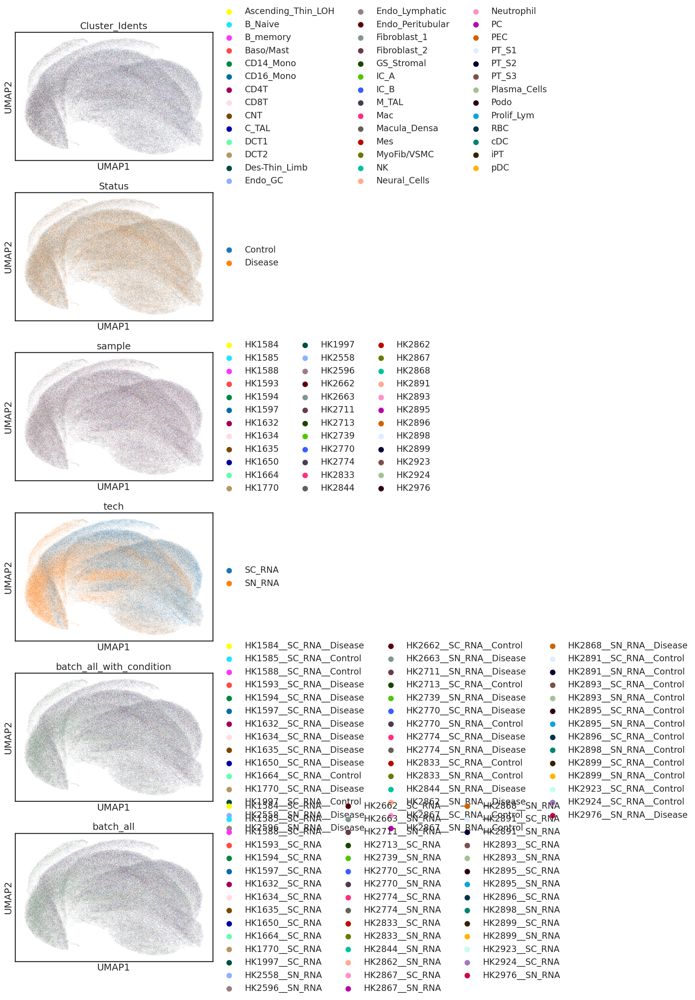

Plot of denoised expression


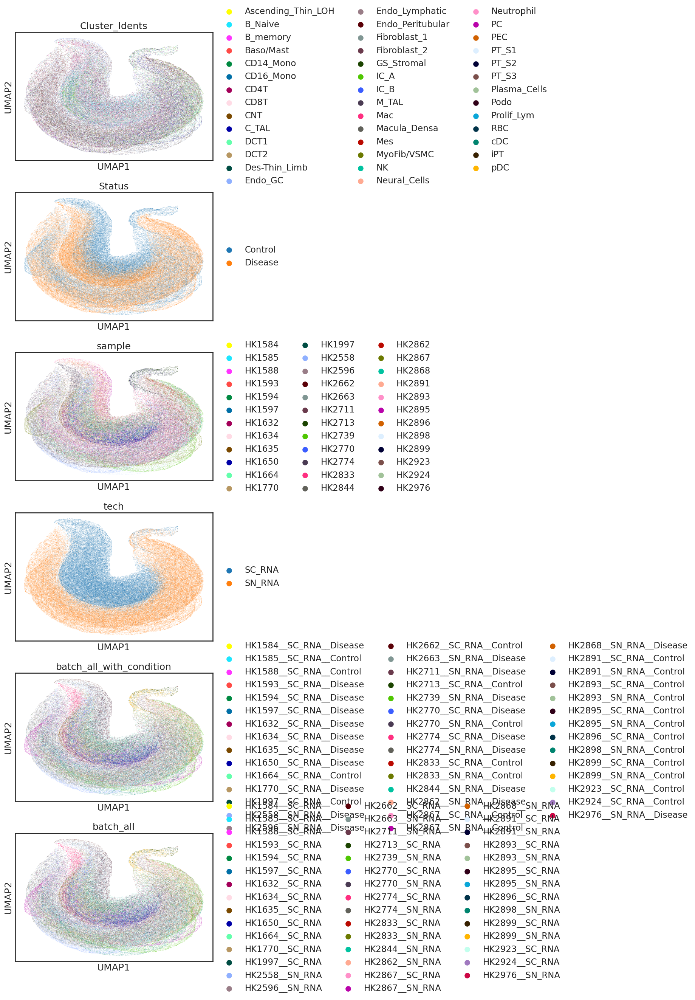

Finish adata preprocessing ====================
Batch-related mixing performance evaluation for main effect:
sample
['/gpfs/gibbs/project/wang_zuoheng/xx244/R/4.3'
 '/vast/palmer/apps/avx2/software/R/4.3.2-foss-2022b-patched/lib64/R/library']


LISI---


cLISI, bLISI, LISI_F1 0.8302318595337506 0.16249817481801096 0.27179828791639765


ASW---


asw_label 0.44520048052072525


asw_batch 0.649557906633269


kBET---


0 labels consist of a single batch or is too small. Skip.
Adding diffusion to step 4
Adding diffusion to step 5


Adding diffusion to step 6
Adding diffusion to step 7
Adding diffusion to step 8


Adding diffusion to step 9
Adding diffusion to step 10


Adding diffusion to step 11


Adding diffusion to step 12


Adding diffusion to step 13


Adding diffusion to step 14


Adding diffusion to step 15


Adding diffusion to step 16


Adding diffusion to step 17


Adding diffusion to step 18


Adding diffusion to step 19


Adding diffusion to step 4
Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 9


Adding diffusion to step 10


Adding diffusion to step 11


Adding diffusion to step 12


Adding diffusion to step 13


Adding diffusion to step 14


Adding diffusion to step 15


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 9


Adding diffusion to step 10


Adding diffusion to step 11


Adding diffusion to step 12


Adding diffusion to step 4
Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 9


Adding diffusion to step 10


Adding diffusion to step 11


Adding diffusion to step 12


Adding diffusion to step 4
Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 9


Adding diffusion to step 10


Adding diffusion to step 11


Adding diffusion to step 12


Adding diffusion to step 13


Adding diffusion to step 14


Adding diffusion to step 15


Adding diffusion to step 16


Adding diffusion to step 17


Adding diffusion to step 18


Adding diffusion to step 19


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 9


Adding diffusion to step 10


Adding diffusion to step 11


Adding diffusion to step 12


Adding diffusion to step 4
Adding diffusion to step 5
Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 9


Adding diffusion to step 10


Adding diffusion to step 11


Adding diffusion to step 12


Adding diffusion to step 4
Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 9


Adding diffusion to step 10


Adding diffusion to step 11


Adding diffusion to step 12


Adding diffusion to step 13


Adding diffusion to step 14


Adding diffusion to step 4
Adding diffusion to step 5
Adding diffusion to step 6
Adding diffusion to step 7


Adding diffusion to step 8
Adding diffusion to step 9


Adding diffusion to step 10


Adding diffusion to step 11


Adding diffusion to step 12


Adding diffusion to step 13


Adding diffusion to step 14


Adding diffusion to step 15


Adding diffusion to step 16


Adding diffusion to step 17


Adding diffusion to step 18


Adding diffusion to step 19


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 4
Adding diffusion to step 5
Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 9


Adding diffusion to step 10


Adding diffusion to step 11


Adding diffusion to step 12


Adding diffusion to step 13


Adding diffusion to step 14


Adding diffusion to step 15


Adding diffusion to step 16


Adding diffusion to step 17


Adding diffusion to step 18


Adding diffusion to step 4
Adding diffusion to step 5
Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 9


Adding diffusion to step 10


Adding diffusion to step 11


Adding diffusion to step 12


Adding diffusion to step 13


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 9


Adding diffusion to step 10


Adding diffusion to step 11


Adding diffusion to step 12


Adding diffusion to step 13


kbet_score 0.2081662114805748


graph_conn 0.055941707712030955


NMI, ARI ---


NMI 0.016093923163708255
ARI 0.004131916786775549
positive and true positive rate---


       ASW_label       ARI       NMI   1-cLISI     bLISI  ASW_batch  \
X_pca     0.4452  0.004132  0.016094  0.830232  0.162498   0.649558   

       kBET Accept Rate  graph connectivity  PCR_batch  pos rate  \
X_pca          0.208166            0.055942        0.0       0.0   

       true pos rate   F1 LISI  
X_pca            0.0  0.271798  
tech
['/gpfs/gibbs/project/wang_zuoheng/xx244/R/4.3'
 '/vast/palmer/apps/avx2/software/R/4.3.2-foss-2022b-patched/lib64/R/library']


Cell cluster Baso/Mast contains only one batch or has less than 10 cells. Skip.


LISI---


cLISI, bLISI, LISI_F1 0.8302318595337506 0.3212887228336344 0.46329025792487155


ASW---


asw_label 0.44520048052072525


asw_batch 0.8297381919724482


kBET---


1 labels consist of a single batch or is too small. Skip.
Adding diffusion to step 4
Adding diffusion to step 5


Adding diffusion to step 6
Adding diffusion to step 7
Adding diffusion to step 8


Adding diffusion to step 9
Adding diffusion to step 10


Adding diffusion to step 11


Adding diffusion to step 12


Adding diffusion to step 13


Adding diffusion to step 14


Adding diffusion to step 15


Adding diffusion to step 16


Adding diffusion to step 17


Adding diffusion to step 18


Adding diffusion to step 19


Adding diffusion to step 4
Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 9


Adding diffusion to step 10


Adding diffusion to step 11


Adding diffusion to step 12


Adding diffusion to step 13


Adding diffusion to step 14


Adding diffusion to step 15


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 9


Adding diffusion to step 10


Adding diffusion to step 11


Adding diffusion to step 12


Adding diffusion to step 4
Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 9


Adding diffusion to step 10


Adding diffusion to step 11


Adding diffusion to step 12


Adding diffusion to step 4
Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 9


Adding diffusion to step 10


Adding diffusion to step 11


Adding diffusion to step 12


Adding diffusion to step 13


Adding diffusion to step 14


Adding diffusion to step 15


Adding diffusion to step 16


Adding diffusion to step 17


Adding diffusion to step 18


Adding diffusion to step 19


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 9


Adding diffusion to step 10


Adding diffusion to step 11


Adding diffusion to step 12


Adding diffusion to step 4
Adding diffusion to step 5
Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 9


Adding diffusion to step 10


Adding diffusion to step 11


Adding diffusion to step 12


Adding diffusion to step 4
Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 9


Adding diffusion to step 10


Adding diffusion to step 11


Adding diffusion to step 12


Adding diffusion to step 13


Adding diffusion to step 14


Adding diffusion to step 4
Adding diffusion to step 5
Adding diffusion to step 6
Adding diffusion to step 7


Adding diffusion to step 8
Adding diffusion to step 9


Adding diffusion to step 10


Adding diffusion to step 11


Adding diffusion to step 12


Adding diffusion to step 13


Adding diffusion to step 14


Adding diffusion to step 15


Adding diffusion to step 16


Adding diffusion to step 17


Adding diffusion to step 18


Adding diffusion to step 19


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 4
Adding diffusion to step 5
Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 9


Adding diffusion to step 10


Adding diffusion to step 11


Adding diffusion to step 12


Adding diffusion to step 13


Adding diffusion to step 14


Adding diffusion to step 15


Adding diffusion to step 16


Adding diffusion to step 17


Adding diffusion to step 18


Adding diffusion to step 4
Adding diffusion to step 5
Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 9


Adding diffusion to step 10


Adding diffusion to step 11


Adding diffusion to step 12


Adding diffusion to step 13


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 9


Adding diffusion to step 10


Adding diffusion to step 11


Adding diffusion to step 12


Adding diffusion to step 13


kbet_score 0.15264872352982461


graph_conn 0.055941707712030955


NMI, ARI ---


NMI 0.016093923163708255
ARI 0.004131916786775549
positive and true positive rate---


       ASW_label       ARI       NMI   1-cLISI     bLISI  ASW_batch  \
X_pca     0.4452  0.004132  0.016094  0.830232  0.321289   0.829738   

       kBET Accept Rate  graph connectivity  PCR_batch  pos rate  \
X_pca          0.152649            0.055942        0.0       0.0   

       true pos rate  F1 LISI  
X_pca            0.0  0.46329  
batch_all_with_condition
['/gpfs/gibbs/project/wang_zuoheng/xx244/R/4.3'
 '/vast/palmer/apps/avx2/software/R/4.3.2-foss-2022b-patched/lib64/R/library']


LISI---


cLISI, bLISI, LISI_F1 0.8302318595337506 0.1386347641028069 0.23759513474637414


ASW---


asw_label 0.44520048052072525


asw_batch 0.6242705927128334


kBET---


0 labels consist of a single batch or is too small. Skip.
Adding diffusion to step 4


Adding diffusion to step 5
Adding diffusion to step 6
Adding diffusion to step 7
Adding diffusion to step 8


Adding diffusion to step 9
Adding diffusion to step 10


Adding diffusion to step 11


Adding diffusion to step 12


Adding diffusion to step 13


Adding diffusion to step 14


Adding diffusion to step 15


Adding diffusion to step 16


Adding diffusion to step 17


Adding diffusion to step 18


Adding diffusion to step 4
Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 9


Adding diffusion to step 10


Adding diffusion to step 11


Adding diffusion to step 12


Adding diffusion to step 13


Adding diffusion to step 14


Adding diffusion to step 15


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 9


Adding diffusion to step 10


Adding diffusion to step 11


Adding diffusion to step 12


Adding diffusion to step 4
Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 9


Adding diffusion to step 10


Adding diffusion to step 11


Adding diffusion to step 12


Adding diffusion to step 4
Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 9


Adding diffusion to step 10


Adding diffusion to step 11


Adding diffusion to step 12


Adding diffusion to step 13


Adding diffusion to step 14


Adding diffusion to step 15


Adding diffusion to step 16


Adding diffusion to step 17


Adding diffusion to step 18


Adding diffusion to step 19


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 9


Adding diffusion to step 10


Adding diffusion to step 11


Adding diffusion to step 12


Adding diffusion to step 4
Adding diffusion to step 5
Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 9


Adding diffusion to step 10


Adding diffusion to step 11


Adding diffusion to step 12


Adding diffusion to step 4
Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 9


Adding diffusion to step 10


Adding diffusion to step 11


Adding diffusion to step 12


Adding diffusion to step 13


Adding diffusion to step 14


Adding diffusion to step 4
Adding diffusion to step 5
Adding diffusion to step 6
Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 9


Adding diffusion to step 10


Adding diffusion to step 11


Adding diffusion to step 12


Adding diffusion to step 13


Adding diffusion to step 14


Adding diffusion to step 15


Adding diffusion to step 16


Adding diffusion to step 17


Adding diffusion to step 18


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 4
Adding diffusion to step 5
Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 9


Adding diffusion to step 10


Adding diffusion to step 11


Adding diffusion to step 12


Adding diffusion to step 13


Adding diffusion to step 14


Adding diffusion to step 15


Adding diffusion to step 16


Adding diffusion to step 17


Adding diffusion to step 18


Adding diffusion to step 4
Adding diffusion to step 5
Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 9


Adding diffusion to step 10


Adding diffusion to step 11


Adding diffusion to step 12


Adding diffusion to step 13


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 9


Adding diffusion to step 10


Adding diffusion to step 11


Adding diffusion to step 12


Adding diffusion to step 13


kbet_score 0.20930473599243515


graph_conn 0.055941707712030955


NMI, ARI ---


NMI 0.016093923163708255
ARI 0.004131916786775549
positive and true positive rate---


       ASW_label       ARI       NMI   1-cLISI     bLISI  ASW_batch  \
X_pca     0.4452  0.004132  0.016094  0.830232  0.138635   0.624271   

       kBET Accept Rate  graph connectivity  PCR_batch  pos rate  \
X_pca          0.209305            0.055942        0.0       0.0   

       true pos rate   F1 LISI  
X_pca            0.0  0.237595  
batch_all
['/gpfs/gibbs/project/wang_zuoheng/xx244/R/4.3'
 '/vast/palmer/apps/avx2/software/R/4.3.2-foss-2022b-patched/lib64/R/library']


LISI---


cLISI, bLISI, LISI_F1 0.8302318595337506 0.1386347641028069 0.23759513474637414


ASW---


asw_label 0.44520048052072525


asw_batch 0.6242705927128334


kBET---


0 labels consist of a single batch or is too small. Skip.
Adding diffusion to step 4
Adding diffusion to step 5


Adding diffusion to step 6
Adding diffusion to step 7
Adding diffusion to step 8


Adding diffusion to step 9
Adding diffusion to step 10


Adding diffusion to step 11


Adding diffusion to step 12


Adding diffusion to step 13


Adding diffusion to step 14


Adding diffusion to step 15


Adding diffusion to step 16


Adding diffusion to step 17


Adding diffusion to step 18


Adding diffusion to step 4
Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 9


Adding diffusion to step 10


Adding diffusion to step 11


Adding diffusion to step 12


Adding diffusion to step 13


Adding diffusion to step 14


Adding diffusion to step 15


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 9


Adding diffusion to step 10


Adding diffusion to step 11


Adding diffusion to step 12


Adding diffusion to step 4
Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 9


Adding diffusion to step 10


Adding diffusion to step 11


Adding diffusion to step 12


Adding diffusion to step 4
Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 9


Adding diffusion to step 10


Adding diffusion to step 11


Adding diffusion to step 12


Adding diffusion to step 13


Adding diffusion to step 14


Adding diffusion to step 15


Adding diffusion to step 16


Adding diffusion to step 17


Adding diffusion to step 18


Adding diffusion to step 19


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 9


Adding diffusion to step 10


Adding diffusion to step 11


Adding diffusion to step 12


Adding diffusion to step 4
Adding diffusion to step 5
Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 9


Adding diffusion to step 10


Adding diffusion to step 11


Adding diffusion to step 12


Adding diffusion to step 4
Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 9


Adding diffusion to step 10


Adding diffusion to step 11


Adding diffusion to step 12


Adding diffusion to step 13


Adding diffusion to step 14


Adding diffusion to step 4
Adding diffusion to step 5
Adding diffusion to step 6
Adding diffusion to step 7


Adding diffusion to step 8
Adding diffusion to step 9


Adding diffusion to step 10


Adding diffusion to step 11


Adding diffusion to step 12


Adding diffusion to step 13


Adding diffusion to step 14


Adding diffusion to step 15


Adding diffusion to step 16


Adding diffusion to step 17


Adding diffusion to step 18


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 4
Adding diffusion to step 5
Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 9


Adding diffusion to step 10


Adding diffusion to step 11


Adding diffusion to step 12


Adding diffusion to step 13


Adding diffusion to step 14


Adding diffusion to step 15


Adding diffusion to step 16


Adding diffusion to step 17


Adding diffusion to step 18


Adding diffusion to step 4
Adding diffusion to step 5
Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 9


Adding diffusion to step 10


Adding diffusion to step 11


Adding diffusion to step 12


Adding diffusion to step 13


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 9


Adding diffusion to step 10


Adding diffusion to step 11


Adding diffusion to step 12


Adding diffusion to step 13


kbet_score 0.2091524805523779


graph_conn 0.055941707712030955


NMI, ARI ---


NMI 0.016093923163708255
ARI 0.004131916786775549
positive and true positive rate---


       ASW_label       ARI       NMI   1-cLISI     bLISI  ASW_batch  \
X_pca     0.4452  0.004132  0.016094  0.830232  0.138635   0.624271   

       kBET Accept Rate  graph connectivity  PCR_batch  pos rate  \
X_pca          0.209152            0.055942        0.0       0.0   

       true pos rate   F1 LISI  
X_pca            0.0  0.237595  
Within each unique condition, evaluate the batch effect of denoised data
Within each unique condition, evaluate the batch effect of denoised data
Now evaluating Control


['/gpfs/gibbs/project/wang_zuoheng/xx244/R/4.3'
 '/vast/palmer/apps/avx2/software/R/4.3.2-foss-2022b-patched/lib64/R/library']


LISI---


cLISI, bLISI, LISI_F1 0.9313447982631637 0.051512592190098565 0.0976255258337631


ASW---


asw_label 0.34358125925064087


asw_batch 0.7138502141993012


kBET---


0 labels consist of a single batch or is too small. Skip.
Adding diffusion to step 4


Adding diffusion to step 5
Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 9


Adding diffusion to step 4
Adding diffusion to step 5
Adding diffusion to step 6


Adding diffusion to step 7
Adding diffusion to step 8


Adding diffusion to step 9


Adding diffusion to step 4
Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 9


Adding diffusion to step 10


Adding diffusion to step 11


Adding diffusion to step 12


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 9


Adding diffusion to step 10


Adding diffusion to step 11


Adding diffusion to step 12


Adding diffusion to step 13


Adding diffusion to step 14


Adding diffusion to step 15


Adding diffusion to step 16


Adding diffusion to step 17


Adding diffusion to step 18


Adding diffusion to step 19


Adding diffusion to step 20


Adding diffusion to step 21


Adding diffusion to step 22


Adding diffusion to step 23


Adding diffusion to step 4
Adding diffusion to step 5
Adding diffusion to step 6
Adding diffusion to step 7


Adding diffusion to step 8
Adding diffusion to step 9


Adding diffusion to step 10
Adding diffusion to step 11


Adding diffusion to step 4
Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 9


Adding diffusion to step 10


Adding diffusion to step 11


Adding diffusion to step 12


Adding diffusion to step 13


Adding diffusion to step 14


Adding diffusion to step 15


Adding diffusion to step 16


Adding diffusion to step 17


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 9


Adding diffusion to step 10


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 9


Adding diffusion to step 10


Adding diffusion to step 11


Adding diffusion to step 12


Adding diffusion to step 13


Adding diffusion to step 14


Adding diffusion to step 15


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 9


Adding diffusion to step 10


Adding diffusion to step 11


Adding diffusion to step 12


Adding diffusion to step 13


Adding diffusion to step 14


Adding diffusion to step 4
Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 9


Adding diffusion to step 10


Adding diffusion to step 11


Adding diffusion to step 12


Adding diffusion to step 13


Adding diffusion to step 14


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 9


Adding diffusion to step 10


Adding diffusion to step 4
Adding diffusion to step 5
Adding diffusion to step 6
Adding diffusion to step 7


Adding diffusion to step 8
Adding diffusion to step 9


Adding diffusion to step 4
Adding diffusion to step 5
Adding diffusion to step 6


Adding diffusion to step 7
Adding diffusion to step 8


Adding diffusion to step 4
Adding diffusion to step 5
Adding diffusion to step 6
Adding diffusion to step 7
Adding diffusion to step 8


Adding diffusion to step 9
Adding diffusion to step 10


Adding diffusion to step 11
Adding diffusion to step 12


Adding diffusion to step 13


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 9


Adding diffusion to step 10


Adding diffusion to step 11


Adding diffusion to step 4
Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 9


Adding diffusion to step 10


Adding diffusion to step 11


Adding diffusion to step 12


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 9


Adding diffusion to step 10


Adding diffusion to step 11


Adding diffusion to step 12


Adding diffusion to step 4
Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 9


Adding diffusion to step 10


Adding diffusion to step 11


Adding diffusion to step 12


Adding diffusion to step 13


kbet_score 0.27530066022770106


graph_conn 0.37771737747366974


NMI, ARI ---
NMI 0.2115602807701071


ARI 0.04454799216114364
positive and true positive rate---


       ASW_label       ARI      NMI   1-cLISI     bLISI  ASW_batch  \
X_pca   0.343581  0.044548  0.21156  0.931345  0.051513    0.71385   

       kBET Accept Rate  graph connectivity  PCR_batch  pos rate  \
X_pca          0.275301            0.377717        0.0  0.246591   

       true pos rate   F1 LISI  
X_pca       0.014352  0.097626  
********************
Within each unique condition, evaluate the batch effect of denoised data
Now evaluating Disease


['/gpfs/gibbs/project/wang_zuoheng/xx244/R/4.3'
 '/vast/palmer/apps/avx2/software/R/4.3.2-foss-2022b-patched/lib64/R/library']


LISI---


cLISI, bLISI, LISI_F1 0.934238983765753 0.044538848561648435 0.08502425625923385


ASW---


asw_label 0.3601706624031067


asw_batch 0.7294929283605521


kBET---


0 labels consist of a single batch or is too small. Skip.
Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 9


Adding diffusion to step 10


Adding diffusion to step 11


Adding diffusion to step 12


Adding diffusion to step 13


Adding diffusion to step 14


Adding diffusion to step 4
Adding diffusion to step 5
Adding diffusion to step 6
Adding diffusion to step 7
Adding diffusion to step 8
Adding diffusion to step 9
Adding diffusion to step 10


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 9


Adding diffusion to step 10


Adding diffusion to step 11


Adding diffusion to step 12


Adding diffusion to step 13


Adding diffusion to step 14


Adding diffusion to step 15


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 9


Adding diffusion to step 10


Adding diffusion to step 11


Adding diffusion to step 12


Adding diffusion to step 13


Adding diffusion to step 14


Adding diffusion to step 15


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 9


Adding diffusion to step 10


Adding diffusion to step 11


Adding diffusion to step 12


Adding diffusion to step 13


Adding diffusion to step 14


Adding diffusion to step 4
Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 9


Adding diffusion to step 10


Adding diffusion to step 11


Adding diffusion to step 12


Adding diffusion to step 13


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 9


Adding diffusion to step 10


Adding diffusion to step 11


Adding diffusion to step 12


Adding diffusion to step 13


Adding diffusion to step 14


Adding diffusion to step 15


Adding diffusion to step 16


Adding diffusion to step 17


Adding diffusion to step 18


Adding diffusion to step 19


Adding diffusion to step 20


Adding diffusion to step 21


Adding diffusion to step 22


Adding diffusion to step 23


Adding diffusion to step 4
Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 9


Adding diffusion to step 10


Adding diffusion to step 4
Adding diffusion to step 5
Adding diffusion to step 6
Adding diffusion to step 7
Adding diffusion to step 8


Adding diffusion to step 9
Adding diffusion to step 10


Adding diffusion to step 11
Adding diffusion to step 12


Adding diffusion to step 13


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 9


Adding diffusion to step 10


Adding diffusion to step 11


Adding diffusion to step 12


Adding diffusion to step 13


Adding diffusion to step 14


Adding diffusion to step 15


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 9


Adding diffusion to step 10


Adding diffusion to step 11


Adding diffusion to step 12


Adding diffusion to step 13


Adding diffusion to step 14


Adding diffusion to step 15


Adding diffusion to step 4
Adding diffusion to step 5
Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 9


Adding diffusion to step 10


Adding diffusion to step 11


Adding diffusion to step 12


Adding diffusion to step 13


Adding diffusion to step 14


Adding diffusion to step 15


Adding diffusion to step 16


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 9


Adding diffusion to step 10


Adding diffusion to step 11


Adding diffusion to step 12


Adding diffusion to step 13


Adding diffusion to step 14


Adding diffusion to step 15


Adding diffusion to step 16


Adding diffusion to step 17


Adding diffusion to step 18


Adding diffusion to step 19


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 4
Adding diffusion to step 5
Adding diffusion to step 6
Adding diffusion to step 7
Adding diffusion to step 8


Adding diffusion to step 9
Adding diffusion to step 10
Adding diffusion to step 11


Adding diffusion to step 12
Adding diffusion to step 13


Adding diffusion to step 14
Adding diffusion to step 15


Adding diffusion to step 16
Adding diffusion to step 17


Adding diffusion to step 4
Adding diffusion to step 5
Adding diffusion to step 6
Adding diffusion to step 7
Adding diffusion to step 8


Adding diffusion to step 9
Adding diffusion to step 10


Adding diffusion to step 11
Adding diffusion to step 12


Adding diffusion to step 13


Adding diffusion to step 14


Adding diffusion to step 15


Adding diffusion to step 4
Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 9


Adding diffusion to step 4
Adding diffusion to step 5
Adding diffusion to step 6
Adding diffusion to step 7
Adding diffusion to step 8


Adding diffusion to step 4
Adding diffusion to step 5
Adding diffusion to step 6


Adding diffusion to step 7
Adding diffusion to step 8


Adding diffusion to step 9


Adding diffusion to step 10


Adding diffusion to step 11


Adding diffusion to step 12


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 9


Adding diffusion to step 10


Adding diffusion to step 11


Adding diffusion to step 12


Adding diffusion to step 4
Adding diffusion to step 5
Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 9


Adding diffusion to step 10


Adding diffusion to step 11


Adding diffusion to step 4
Adding diffusion to step 5
Adding diffusion to step 6
Adding diffusion to step 7


Adding diffusion to step 8
Adding diffusion to step 9


Adding diffusion to step 10
Adding diffusion to step 11


Adding diffusion to step 12


Adding diffusion to step 13


Adding diffusion to step 4
Adding diffusion to step 5
Adding diffusion to step 6
Adding diffusion to step 7
Adding diffusion to step 8
Adding diffusion to step 9


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 9


kbet_score 0.3008757005821595


graph_conn 0.3924613281014527


NMI, ARI ---


NMI 0.22321276662073222
ARI 0.04697886682631312
positive and true positive rate---


       ASW_label       ARI       NMI   1-cLISI     bLISI  ASW_batch  \
X_pca   0.360171  0.046979  0.223213  0.934239  0.044539   0.729493   

       kBET Accept Rate  graph connectivity  PCR_batch  pos rate  \
X_pca          0.300876            0.392461        0.0  0.302419   

       true pos rate   F1 LISI  
X_pca        0.00019  0.085024  
********************
Batch-related mixing performance evaluation for main effect:
Batch-related mixing performance evaluation for main effect:
sample
['/gpfs/gibbs/project/wang_zuoheng/xx244/R/4.3'
 '/vast/palmer/apps/avx2/software/R/4.3.2-foss-2022b-patched/lib64/R/library']


LISI---


cLISI, bLISI, LISI_F1 0.8302318595337506 0.16249817481801096 0.27179828791639765


ASW---


asw_label 0.44520048052072525


asw_batch 0.649557906633269


kBET---


0 labels consist of a single batch or is too small. Skip.
Adding diffusion to step 4
Adding diffusion to step 5


Adding diffusion to step 6
Adding diffusion to step 7
Adding diffusion to step 8


Adding diffusion to step 9
Adding diffusion to step 10


Adding diffusion to step 11


Adding diffusion to step 12


Adding diffusion to step 13


Adding diffusion to step 14


Adding diffusion to step 15


Adding diffusion to step 16


Adding diffusion to step 17


Adding diffusion to step 18


Adding diffusion to step 19


Adding diffusion to step 4
Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 9


Adding diffusion to step 10


Adding diffusion to step 11


Adding diffusion to step 12


Adding diffusion to step 13


Adding diffusion to step 14


Adding diffusion to step 15


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 9


Adding diffusion to step 10


Adding diffusion to step 11


Adding diffusion to step 12


Adding diffusion to step 4
Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 9


Adding diffusion to step 10


Adding diffusion to step 11


Adding diffusion to step 12


Adding diffusion to step 4
Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 9


Adding diffusion to step 10


Adding diffusion to step 11


Adding diffusion to step 12


Adding diffusion to step 13


Adding diffusion to step 14


Adding diffusion to step 15


Adding diffusion to step 16


Adding diffusion to step 17


Adding diffusion to step 18


Adding diffusion to step 19


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 9


Adding diffusion to step 10


Adding diffusion to step 11


Adding diffusion to step 12


Adding diffusion to step 4
Adding diffusion to step 5
Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 9


Adding diffusion to step 10


Adding diffusion to step 11


Adding diffusion to step 12


Adding diffusion to step 4
Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 9


Adding diffusion to step 10


Adding diffusion to step 11


Adding diffusion to step 12


Adding diffusion to step 13


Adding diffusion to step 14


Adding diffusion to step 4
Adding diffusion to step 5
Adding diffusion to step 6
Adding diffusion to step 7


Adding diffusion to step 8
Adding diffusion to step 9


Adding diffusion to step 10


Adding diffusion to step 11


Adding diffusion to step 12


Adding diffusion to step 13


Adding diffusion to step 14


Adding diffusion to step 15


Adding diffusion to step 16


Adding diffusion to step 17


Adding diffusion to step 18


Adding diffusion to step 19


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 4
Adding diffusion to step 5
Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 9


Adding diffusion to step 10


Adding diffusion to step 11


Adding diffusion to step 12


Adding diffusion to step 13


Adding diffusion to step 14


Adding diffusion to step 15


Adding diffusion to step 16


Adding diffusion to step 17


Adding diffusion to step 18


Adding diffusion to step 4
Adding diffusion to step 5
Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 9


Adding diffusion to step 10


Adding diffusion to step 11


Adding diffusion to step 12


Adding diffusion to step 13


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 9


Adding diffusion to step 10


Adding diffusion to step 11


Adding diffusion to step 12


Adding diffusion to step 13


kbet_score 0.20814618687946462


graph_conn 0.055941707712030955


NMI, ARI ---


NMI 0.016093923163708255
ARI 0.004131916786775549
positive and true positive rate---


       ASW_label       ARI       NMI   1-cLISI     bLISI  ASW_batch  \
X_pca     0.4452  0.004132  0.016094  0.830232  0.162498   0.649558   

       kBET Accept Rate  graph connectivity  PCR_batch  pos rate  \
X_pca          0.208146            0.055942        0.0       0.0   

       true pos rate   F1 LISI  
X_pca            0.0  0.271798  
Batch-related mixing performance evaluation for main effect:
tech
['/gpfs/gibbs/project/wang_zuoheng/xx244/R/4.3'
 '/vast/palmer/apps/avx2/software/R/4.3.2-foss-2022b-patched/lib64/R/library']


Cell cluster Baso/Mast contains only one batch or has less than 10 cells. Skip.


LISI---


cLISI, bLISI, LISI_F1 0.8302318595337506 0.3212887228336344 0.46329025792487155


ASW---


asw_label 0.44520048052072525


asw_batch 0.8297381919724482


kBET---


1 labels consist of a single batch or is too small. Skip.
Adding diffusion to step 4
Adding diffusion to step 5


Adding diffusion to step 6
Adding diffusion to step 7
Adding diffusion to step 8


Adding diffusion to step 9
Adding diffusion to step 10


Adding diffusion to step 11


Adding diffusion to step 12


Adding diffusion to step 13


Adding diffusion to step 14


Adding diffusion to step 15


Adding diffusion to step 16


Adding diffusion to step 17


Adding diffusion to step 18


Adding diffusion to step 19


Adding diffusion to step 4
Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 9


Adding diffusion to step 10


Adding diffusion to step 11


Adding diffusion to step 12


Adding diffusion to step 13


Adding diffusion to step 14


Adding diffusion to step 15


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 9


Adding diffusion to step 10


Adding diffusion to step 11


Adding diffusion to step 12


Adding diffusion to step 4
Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 9


Adding diffusion to step 10


Adding diffusion to step 11


Adding diffusion to step 12


Adding diffusion to step 4
Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 9


Adding diffusion to step 10


Adding diffusion to step 11


Adding diffusion to step 12


Adding diffusion to step 13


Adding diffusion to step 14


Adding diffusion to step 15


Adding diffusion to step 16


Adding diffusion to step 17


Adding diffusion to step 18


Adding diffusion to step 19


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 9


Adding diffusion to step 10


Adding diffusion to step 11


Adding diffusion to step 12


Adding diffusion to step 4
Adding diffusion to step 5
Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 9


Adding diffusion to step 10


Adding diffusion to step 11


Adding diffusion to step 12


Adding diffusion to step 4
Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 9


Adding diffusion to step 10


Adding diffusion to step 11


Adding diffusion to step 12


Adding diffusion to step 13


Adding diffusion to step 14


Adding diffusion to step 4
Adding diffusion to step 5
Adding diffusion to step 6
Adding diffusion to step 7


Adding diffusion to step 8
Adding diffusion to step 9


Adding diffusion to step 10


Adding diffusion to step 11


Adding diffusion to step 12


Adding diffusion to step 13


Adding diffusion to step 14


Adding diffusion to step 15


Adding diffusion to step 16


Adding diffusion to step 17


Adding diffusion to step 18


Adding diffusion to step 19


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 4
Adding diffusion to step 5
Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 9


Adding diffusion to step 10


Adding diffusion to step 11


Adding diffusion to step 12


Adding diffusion to step 13


Adding diffusion to step 14


Adding diffusion to step 15


Adding diffusion to step 16


Adding diffusion to step 17


Adding diffusion to step 18


Adding diffusion to step 4
Adding diffusion to step 5
Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 9


Adding diffusion to step 10


Adding diffusion to step 11


Adding diffusion to step 12


Adding diffusion to step 13


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 9


Adding diffusion to step 10


Adding diffusion to step 11


Adding diffusion to step 12


Adding diffusion to step 13


kbet_score 0.1527431417675691


graph_conn 0.055941707712030955


NMI, ARI ---


NMI 0.016093923163708255
ARI 0.004131916786775549
positive and true positive rate---


       ASW_label       ARI       NMI   1-cLISI     bLISI  ASW_batch  \
X_pca     0.4452  0.004132  0.016094  0.830232  0.321289   0.829738   

       kBET Accept Rate  graph connectivity  PCR_batch  pos rate  \
X_pca          0.152743            0.055942        0.0       0.0   

       true pos rate  F1 LISI  
X_pca            0.0  0.46329  
Batch-related mixing performance evaluation for main effect:
batch_all_with_condition
['/gpfs/gibbs/project/wang_zuoheng/xx244/R/4.3'
 '/vast/palmer/apps/avx2/software/R/4.3.2-foss-2022b-patched/lib64/R/library']


LISI---


cLISI, bLISI, LISI_F1 0.8302318595337506 0.1386347641028069 0.23759513474637414


ASW---


asw_label 0.44520048052072525


asw_batch 0.6242705927128334


kBET---


0 labels consist of a single batch or is too small. Skip.
Adding diffusion to step 4


Adding diffusion to step 5
Adding diffusion to step 6
Adding diffusion to step 7
Adding diffusion to step 8


Adding diffusion to step 9
Adding diffusion to step 10


Adding diffusion to step 11


Adding diffusion to step 12


Adding diffusion to step 13


Adding diffusion to step 14


Adding diffusion to step 15


Adding diffusion to step 16


Adding diffusion to step 17


Adding diffusion to step 18


Adding diffusion to step 4
Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 9


Adding diffusion to step 10


Adding diffusion to step 11


Adding diffusion to step 12


Adding diffusion to step 13


Adding diffusion to step 14


Adding diffusion to step 15


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 9


Adding diffusion to step 10


Adding diffusion to step 11


Adding diffusion to step 12


Adding diffusion to step 4
Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 9


Adding diffusion to step 10


Adding diffusion to step 11


Adding diffusion to step 12


Adding diffusion to step 4
Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 9


Adding diffusion to step 10


Adding diffusion to step 11


Adding diffusion to step 12


Adding diffusion to step 13


Adding diffusion to step 14


Adding diffusion to step 15


Adding diffusion to step 16


Adding diffusion to step 17


Adding diffusion to step 18


Adding diffusion to step 19


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 9


Adding diffusion to step 10


Adding diffusion to step 11


Adding diffusion to step 12


Adding diffusion to step 4
Adding diffusion to step 5
Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 9


Adding diffusion to step 10


Adding diffusion to step 11


Adding diffusion to step 12


Adding diffusion to step 4
Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 9


Adding diffusion to step 10


Adding diffusion to step 11


Adding diffusion to step 12


Adding diffusion to step 13


Adding diffusion to step 14


Adding diffusion to step 4
Adding diffusion to step 5
Adding diffusion to step 6
Adding diffusion to step 7


Adding diffusion to step 8
Adding diffusion to step 9


Adding diffusion to step 10


Adding diffusion to step 11


Adding diffusion to step 12


Adding diffusion to step 13


Adding diffusion to step 14


Adding diffusion to step 15


Adding diffusion to step 16


Adding diffusion to step 17


Adding diffusion to step 18


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 4
Adding diffusion to step 5
Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 9


Adding diffusion to step 10


Adding diffusion to step 11


Adding diffusion to step 12


Adding diffusion to step 13


Adding diffusion to step 14


Adding diffusion to step 15


Adding diffusion to step 16


Adding diffusion to step 17


Adding diffusion to step 18


Adding diffusion to step 4
Adding diffusion to step 5
Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 9


Adding diffusion to step 10


Adding diffusion to step 11


Adding diffusion to step 12


Adding diffusion to step 13


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 9


Adding diffusion to step 10


Adding diffusion to step 11


Adding diffusion to step 12


Adding diffusion to step 13


kbet_score 0.20918294787671898


graph_conn 0.055941707712030955


NMI, ARI ---


NMI 0.016093923163708255
ARI 0.004131916786775549
positive and true positive rate---


       ASW_label       ARI       NMI   1-cLISI     bLISI  ASW_batch  \
X_pca     0.4452  0.004132  0.016094  0.830232  0.138635   0.624271   

       kBET Accept Rate  graph connectivity  PCR_batch  pos rate  \
X_pca          0.209183            0.055942        0.0       0.0   

       true pos rate   F1 LISI  
X_pca            0.0  0.237595  
Batch-related mixing performance evaluation for main effect:
batch_all
['/gpfs/gibbs/project/wang_zuoheng/xx244/R/4.3'
 '/vast/palmer/apps/avx2/software/R/4.3.2-foss-2022b-patched/lib64/R/library']


LISI---


cLISI, bLISI, LISI_F1 0.8302318595337506 0.1386347641028069 0.23759513474637414


ASW---


asw_label 0.44520048052072525


asw_batch 0.6242705927128334


kBET---


0 labels consist of a single batch or is too small. Skip.
Adding diffusion to step 4
Adding diffusion to step 5


Adding diffusion to step 6
Adding diffusion to step 7
Adding diffusion to step 8


Adding diffusion to step 9
Adding diffusion to step 10


Adding diffusion to step 11


Adding diffusion to step 12


Adding diffusion to step 13


Adding diffusion to step 14


Adding diffusion to step 15


Adding diffusion to step 16


Adding diffusion to step 17


Adding diffusion to step 18


Adding diffusion to step 4
Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 9


Adding diffusion to step 10


Adding diffusion to step 11


Adding diffusion to step 12


Adding diffusion to step 13


Adding diffusion to step 14


Adding diffusion to step 15


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 9


Adding diffusion to step 10


Adding diffusion to step 11


Adding diffusion to step 12


Adding diffusion to step 4
Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 9


Adding diffusion to step 10


Adding diffusion to step 11


Adding diffusion to step 12


Adding diffusion to step 4
Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 9


Adding diffusion to step 10


Adding diffusion to step 11


Adding diffusion to step 12


Adding diffusion to step 13


Adding diffusion to step 14


Adding diffusion to step 15


Adding diffusion to step 16


Adding diffusion to step 17


Adding diffusion to step 18


Adding diffusion to step 19


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 9


Adding diffusion to step 10


Adding diffusion to step 11


Adding diffusion to step 12


Adding diffusion to step 4
Adding diffusion to step 5
Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 9


Adding diffusion to step 10


Adding diffusion to step 11


Adding diffusion to step 12


Adding diffusion to step 4
Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 9


Adding diffusion to step 10


Adding diffusion to step 11


Adding diffusion to step 12


Adding diffusion to step 13


Adding diffusion to step 14


Adding diffusion to step 4
Adding diffusion to step 5
Adding diffusion to step 6
Adding diffusion to step 7


Adding diffusion to step 8
Adding diffusion to step 9


Adding diffusion to step 10


Adding diffusion to step 11


Adding diffusion to step 12


Adding diffusion to step 13


Adding diffusion to step 14


Adding diffusion to step 15


Adding diffusion to step 16


Adding diffusion to step 17


Adding diffusion to step 18


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 4
Adding diffusion to step 5
Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 9


Adding diffusion to step 10


Adding diffusion to step 11


Adding diffusion to step 12


Adding diffusion to step 13


Adding diffusion to step 14


Adding diffusion to step 15


Adding diffusion to step 16


Adding diffusion to step 17


Adding diffusion to step 18


Adding diffusion to step 4
Adding diffusion to step 5
Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 9


Adding diffusion to step 10


Adding diffusion to step 11


Adding diffusion to step 12


Adding diffusion to step 13


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 8


Adding diffusion to step 9


Adding diffusion to step 10


Adding diffusion to step 11


Adding diffusion to step 12


Adding diffusion to step 13


kbet_score 0.20918652429541917


graph_conn 0.055941707712030955


NMI, ARI ---


NMI 0.016093923163708255
ARI 0.004131916786775549
positive and true positive rate---


       ASW_label       ARI       NMI   1-cLISI     bLISI  ASW_batch  \
X_pca     0.4452  0.004132  0.016094  0.830232  0.138635   0.624271   

       kBET Accept Rate  graph connectivity  PCR_batch  pos rate  \
X_pca          0.209187            0.055942        0.0       0.0   

       true pos rate   F1 LISI  
X_pca            0.0  0.237595  


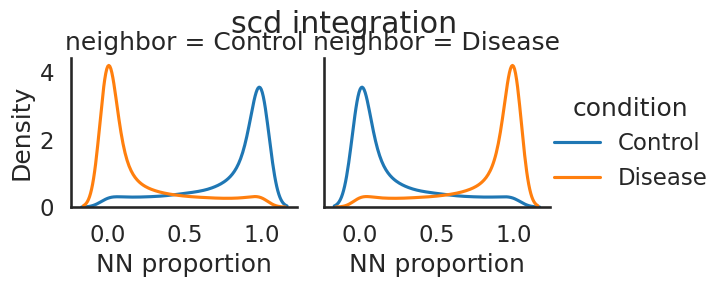

neighbor    Control   Disease
condition                    
Control    0.787291  0.212709
Disease    0.189732  0.810268


In [4]:
adata=sc.read_h5ad("./scd/kidney_latent.h5ad")
evaluate_scd(adata=adata,cell_type_key='Cluster_Idents',batch_key=['sample','tech'],
                   condition_key="Status",dataset_name="kidney")

# Mouse radiation experiment dataset

https://www.ncbi.nlm.nih.gov/geo/query/acc.cgi?acc=GSE280883

AnnData object with n_obs × n_vars = 91288 × 3000
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'seq_folder', 'nUMI', 'nGene', 'log10GenesPerUMI', 'mitoRatio', 'cells', 'sample', 'replicate', 'compartment', 'source', 'day', 'batch', 'multiplet_state', 'ident', 'real_batch', 'n_genes', 'n_counts'
    var: 'gene_id', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection'
    uns: 'X_name', 'hvg', 'log1p'
    obsm: 'main_effect'
    layers: 'denoised', 'logcounts'
adata preprocessing...


batch_all ['D10__1.0__CY' 'D10__1.0__LL' 'D20__1.0__CY' 'D2__1.0__CY' 'D2__2.0__CY'
 'D3.5__1.0__LL' 'D3.5__2.0__LL' 'D3.5__3.0__LL' 'D3.5__4.0__LL']


batch_all_with_condition ['D10__1.0__CY__C' 'D10__1.0__CY__SR' 'D10__1.0__LL__SR' 'D20__1.0__CY__C'
 'D20__1.0__CY__SR' 'D2__1.0__CY__C' 'D2__1.0__CY__SR' 'D2__2.0__CY__SR'
 'D3.5__1.0__LL__C' 'D3.5__1.0__LL__SR' 'D3.5__2.0__LL__C'
 'D3.5__2.0__LL__SR' 'D3.5__3.0__LL__SR' 'D3.5__4.0__LL__SR']


Finish preprocessing
Calculating global distortion...


Finish
Evaluate gene-level signal distortion


Finish
Plot of main effect:


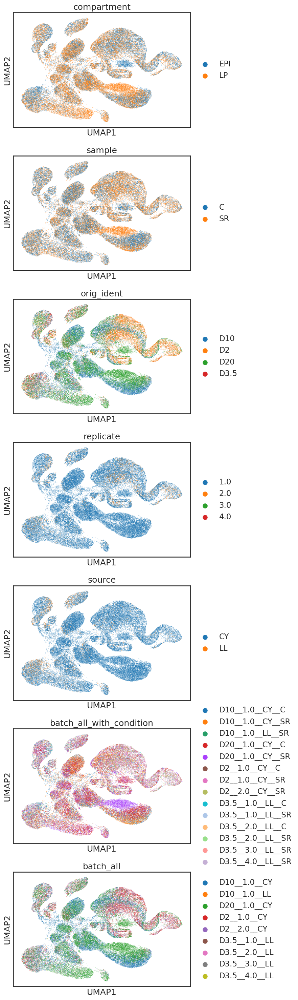

Plot of denoised expression


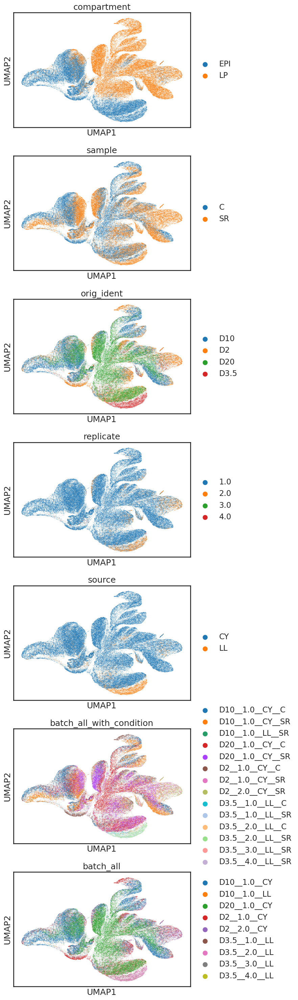

Finish adata preprocessing ====================
Batch-related mixing performance evaluation for main effect:
orig_ident
['/gpfs/gibbs/project/wang_zuoheng/xx244/R/4.3'
 '/vast/palmer/apps/avx2/software/R/4.3.2-foss-2022b-patched/lib64/R/library']
LISI---


cLISI, bLISI, LISI_F1 0.31442564454148747 0.3029371312833613 0.3085744929536979


ASW---


asw_label 0.5065057454630733


asw_batch 0.8364928880756979


kBET---


0 labels consist of a single batch or is too small. Skip.


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 4


kbet_score 0.029229734174276434
graph_conn 0.9976415746094509


NMI, ARI ---
NMI 0.025344738905345783
ARI 0.005880498202168204
positive and true positive rate---


       ASW_label      ARI       NMI   1-cLISI     bLISI  ASW_batch  \
X_pca   0.506506  0.00588  0.025345  0.314426  0.302937   0.836493   

       kBET Accept Rate  graph connectivity  PCR_batch  pos rate  \
X_pca           0.02923            0.997642        0.0  0.606575   

       true pos rate   F1 LISI  
X_pca       0.044979  0.308574  
replicate
['/gpfs/gibbs/project/wang_zuoheng/xx244/R/4.3'
 '/vast/palmer/apps/avx2/software/R/4.3.2-foss-2022b-patched/lib64/R/library']
LISI---


cLISI, bLISI, LISI_F1 0.31442564454148747 0.10562330469304147 0.1581276454433825


ASW---


asw_label 0.5065057454630733


asw_batch 0.7774232572581163


kBET---


0 labels consist of a single batch or is too small. Skip.


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 4


kbet_score 0.4347926984986844
graph_conn 0.9976415746094509


NMI, ARI ---
NMI 0.025344738905345783
ARI 0.005880498202168204
positive and true positive rate---


       ASW_label      ARI       NMI   1-cLISI     bLISI  ASW_batch  \
X_pca   0.506506  0.00588  0.025345  0.314426  0.105623   0.777423   

       kBET Accept Rate  graph connectivity  PCR_batch  pos rate  \
X_pca          0.434793            0.997642        0.0  0.606575   

       true pos rate   F1 LISI  
X_pca        0.51251  0.158128  
source
['/gpfs/gibbs/project/wang_zuoheng/xx244/R/4.3'
 '/vast/palmer/apps/avx2/software/R/4.3.2-foss-2022b-patched/lib64/R/library']
Cell cluster LP contains only one batch or has less than 10 cells. Skip.
LISI---


cLISI, bLISI, LISI_F1 0.31442564454148747 0.3142760078686564 0.31435080839763196


ASW---


asw_label 0.5065057454630733


asw_batch 0.8048068088187932


kBET---


1 labels consist of a single batch or is too small. Skip.


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


kbet_score 0.1932115384615385
graph_conn 0.9976415746094509


NMI, ARI ---
NMI 0.025344738905345783
ARI 0.005880498202168204
positive and true positive rate---


       ASW_label      ARI       NMI   1-cLISI     bLISI  ASW_batch  \
X_pca   0.506506  0.00588  0.025345  0.314426  0.314276   0.804807   

       kBET Accept Rate  graph connectivity  PCR_batch  pos rate  \
X_pca          0.193212            0.997642        0.0  0.606575   

       true pos rate   F1 LISI  
X_pca       0.444396  0.314351  
batch_all_with_condition
['/gpfs/gibbs/project/wang_zuoheng/xx244/R/4.3'
 '/vast/palmer/apps/avx2/software/R/4.3.2-foss-2022b-patched/lib64/R/library']
LISI---


cLISI, bLISI, LISI_F1 0.31442564454148747 0.19567843986812897 0.24123045260309334


ASW---


asw_label 0.5065057454630733


asw_batch 0.8194017977278383


kBET---


0 labels consist of a single batch or is too small. Skip.


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 4


kbet_score 0.008767540338182944
graph_conn 0.9976415746094509


NMI, ARI ---
NMI 0.025344738905345783
ARI 0.005880498202168204
positive and true positive rate---


       ASW_label      ARI       NMI   1-cLISI     bLISI  ASW_batch  \
X_pca   0.506506  0.00588  0.025345  0.314426  0.195678   0.819402   

       kBET Accept Rate  graph connectivity  PCR_batch  pos rate  \
X_pca          0.008768            0.997642        0.0  0.606575   

       true pos rate  F1 LISI  
X_pca       0.031154  0.24123  
batch_all
['/gpfs/gibbs/project/wang_zuoheng/xx244/R/4.3'
 '/vast/palmer/apps/avx2/software/R/4.3.2-foss-2022b-patched/lib64/R/library']
LISI---


cLISI, bLISI, LISI_F1 0.31442564454148747 0.2166184143223722 0.25651500438056074


ASW---


asw_label 0.5065057454630733


asw_batch 0.7954570969666157


kBET---


0 labels consist of a single batch or is too small. Skip.


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 4


kbet_score 0.022558325917040767
graph_conn 0.9976415746094509


NMI, ARI ---
NMI 0.025344738905345783
ARI 0.005880498202168204
positive and true positive rate---


       ASW_label      ARI       NMI   1-cLISI     bLISI  ASW_batch  \
X_pca   0.506506  0.00588  0.025345  0.314426  0.216618   0.795457   

       kBET Accept Rate  graph connectivity  PCR_batch  pos rate  \
X_pca          0.022558            0.997642        0.0  0.606575   

       true pos rate   F1 LISI  
X_pca       0.052471  0.256515  
Within each unique condition, evaluate the batch effect of denoised data
Within each unique condition, evaluate the batch effect of denoised data
Now evaluating C


['/gpfs/gibbs/project/wang_zuoheng/xx244/R/4.3'
 '/vast/palmer/apps/avx2/software/R/4.3.2-foss-2022b-patched/lib64/R/library']
LISI---


cLISI, bLISI, LISI_F1 0.9407629951488412 0.20090818490771717 0.33110581940824296


ASW---


asw_label 0.6074265167117119


asw_batch 0.7639680077816977


kBET---


0 labels consist of a single batch or is too small. Skip.


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


kbet_score 0.043505138370581786
graph_conn 0.9958651647032608


NMI, ARI ---
NMI 0.3804577971429967
ARI 0.20908146438703612
positive and true positive rate---


       ASW_label       ARI       NMI   1-cLISI     bLISI  ASW_batch  \
X_pca   0.607427  0.209081  0.380458  0.940763  0.200908   0.763968   

       kBET Accept Rate  graph connectivity  PCR_batch  pos rate  \
X_pca          0.043505            0.995865        0.0  0.969685   

       true pos rate   F1 LISI  
X_pca       0.055672  0.331106  
********************
Within each unique condition, evaluate the batch effect of denoised data
Now evaluating SR


['/gpfs/gibbs/project/wang_zuoheng/xx244/R/4.3'
 '/vast/palmer/apps/avx2/software/R/4.3.2-foss-2022b-patched/lib64/R/library']
LISI---


cLISI, bLISI, LISI_F1 0.8835142047557636 0.1783768981336935 0.29682614888204045


ASW---


asw_label 0.5989499539136887


asw_batch 0.802987453315963


kBET---


0 labels consist of a single batch or is too small. Skip.


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 7


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


kbet_score 0.01749037281432808
graph_conn 0.9949681498386111


NMI, ARI ---
NMI 0.285933565703286
ARI 0.1679652197554168
positive and true positive rate---


       ASW_label       ARI       NMI   1-cLISI     bLISI  ASW_batch  \
X_pca    0.59895  0.167965  0.285934  0.883514  0.178377   0.802987   

       kBET Accept Rate  graph connectivity  PCR_batch  pos rate  \
X_pca           0.01749            0.994968        0.0  0.943912   

       true pos rate   F1 LISI  
X_pca       0.024634  0.296826  
********************
Batch-related mixing performance evaluation for main effect:
Batch-related mixing performance evaluation for main effect:
orig_ident
['/gpfs/gibbs/project/wang_zuoheng/xx244/R/4.3'
 '/vast/palmer/apps/avx2/software/R/4.3.2-foss-2022b-patched/lib64/R/library']
LISI---


cLISI, bLISI, LISI_F1 0.31442564454148747 0.3029371312833613 0.3085744929536979


ASW---


asw_label 0.5065057454630733


asw_batch 0.8364928880756979


kBET---


0 labels consist of a single batch or is too small. Skip.


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 4


kbet_score 0.02936501460687202
graph_conn 0.9976415746094509


NMI, ARI ---
NMI 0.025344738905345783
ARI 0.005880498202168204
positive and true positive rate---


       ASW_label      ARI       NMI   1-cLISI     bLISI  ASW_batch  \
X_pca   0.506506  0.00588  0.025345  0.314426  0.302937   0.836493   

       kBET Accept Rate  graph connectivity  PCR_batch  pos rate  \
X_pca          0.029365            0.997642        0.0  0.606575   

       true pos rate   F1 LISI  
X_pca       0.044979  0.308574  
Batch-related mixing performance evaluation for main effect:
replicate
['/gpfs/gibbs/project/wang_zuoheng/xx244/R/4.3'
 '/vast/palmer/apps/avx2/software/R/4.3.2-foss-2022b-patched/lib64/R/library']
LISI---


cLISI, bLISI, LISI_F1 0.31442564454148747 0.10562330469304147 0.1581276454433825


ASW---


asw_label 0.5065057454630733


asw_batch 0.7774232572581163


kBET---


0 labels consist of a single batch or is too small. Skip.


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 4


kbet_score 0.43586150799024914
graph_conn 0.9976415746094509


NMI, ARI ---
NMI 0.025344738905345783
ARI 0.005880498202168204
positive and true positive rate---


       ASW_label      ARI       NMI   1-cLISI     bLISI  ASW_batch  \
X_pca   0.506506  0.00588  0.025345  0.314426  0.105623   0.777423   

       kBET Accept Rate  graph connectivity  PCR_batch  pos rate  \
X_pca          0.435862            0.997642        0.0  0.606575   

       true pos rate   F1 LISI  
X_pca        0.51251  0.158128  
Batch-related mixing performance evaluation for main effect:
source
['/gpfs/gibbs/project/wang_zuoheng/xx244/R/4.3'
 '/vast/palmer/apps/avx2/software/R/4.3.2-foss-2022b-patched/lib64/R/library']
Cell cluster LP contains only one batch or has less than 10 cells. Skip.
LISI---


cLISI, bLISI, LISI_F1 0.31442564454148747 0.3142760078686564 0.31435080839763196


ASW---


asw_label 0.5065057454630733


asw_batch 0.8048068088187932


kBET---


1 labels consist of a single batch or is too small. Skip.


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


kbet_score 0.19283894230769227
graph_conn 0.9976415746094509


NMI, ARI ---
NMI 0.025344738905345783
ARI 0.005880498202168204
positive and true positive rate---


       ASW_label      ARI       NMI   1-cLISI     bLISI  ASW_batch  \
X_pca   0.506506  0.00588  0.025345  0.314426  0.314276   0.804807   

       kBET Accept Rate  graph connectivity  PCR_batch  pos rate  \
X_pca          0.192839            0.997642        0.0  0.606575   

       true pos rate   F1 LISI  
X_pca       0.444396  0.314351  
Batch-related mixing performance evaluation for main effect:
batch_all_with_condition
['/gpfs/gibbs/project/wang_zuoheng/xx244/R/4.3'
 '/vast/palmer/apps/avx2/software/R/4.3.2-foss-2022b-patched/lib64/R/library']
LISI---


cLISI, bLISI, LISI_F1 0.31442564454148747 0.19567843986812897 0.24123045260309334


ASW---


asw_label 0.5065057454630733


asw_batch 0.8194017977278383


kBET---


0 labels consist of a single batch or is too small. Skip.


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 4


kbet_score 0.008917166460300274
graph_conn 0.9976415746094509


NMI, ARI ---
NMI 0.025344738905345783
ARI 0.005880498202168204
positive and true positive rate---


       ASW_label      ARI       NMI   1-cLISI     bLISI  ASW_batch  \
X_pca   0.506506  0.00588  0.025345  0.314426  0.195678   0.819402   

       kBET Accept Rate  graph connectivity  PCR_batch  pos rate  \
X_pca          0.008917            0.997642        0.0  0.606575   

       true pos rate  F1 LISI  
X_pca       0.031154  0.24123  
Batch-related mixing performance evaluation for main effect:
batch_all
['/gpfs/gibbs/project/wang_zuoheng/xx244/R/4.3'
 '/vast/palmer/apps/avx2/software/R/4.3.2-foss-2022b-patched/lib64/R/library']
LISI---


cLISI, bLISI, LISI_F1 0.31442564454148747 0.2166184143223722 0.25651500438056074


ASW---


asw_label 0.5065057454630733


asw_batch 0.7954570969666157


kBET---


0 labels consist of a single batch or is too small. Skip.


Adding diffusion to step 4


Adding diffusion to step 5


Adding diffusion to step 6


Adding diffusion to step 4


kbet_score 0.022812427449311334
graph_conn 0.9976415746094509


NMI, ARI ---
NMI 0.025344738905345783
ARI 0.005880498202168204
positive and true positive rate---


       ASW_label      ARI       NMI   1-cLISI     bLISI  ASW_batch  \
X_pca   0.506506  0.00588  0.025345  0.314426  0.216618   0.795457   

       kBET Accept Rate  graph connectivity  PCR_batch  pos rate  \
X_pca          0.022812            0.997642        0.0  0.606575   

       true pos rate   F1 LISI  
X_pca       0.052471  0.256515  


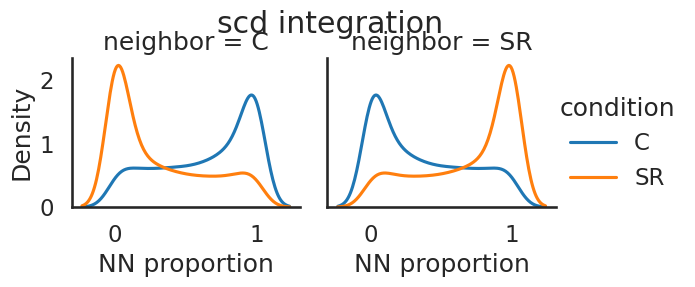

neighbor          C        SR
condition                    
C          0.641294  0.358706
SR         0.304554  0.695446


In [5]:
adata=sc.read_h5ad("./scd/mouse_latent.h5ad")
print(adata)
adata.obs['orig_ident']=adata.obs['orig.ident'].copy()
evaluate_scd(adata=adata,cell_type_key='compartment',batch_key=['orig_ident',"replicate","source"],
                   condition_key="sample",dataset_name="mouse")